# Final Project: Seattle Traffic Accidents
## Motivation
This notebook contains analysis on traffic collision data in the city of Seattle. The dataset contains about 200.000 logs from the years 2004-2020. The decision to work with traffic accident data came from the fact that it relates well to the course work and this specific dataset contained a lot of information on each accident log (weather, road condition, DUI?, collision type, location,..) which allows for many different perspectives on the analysis. 

A decision was made to approach this from the point of someone who is interested in finding out when and where accidents are more likely to occur and what factors affect how severe an accident is. Based on this criteria it made sense to tell the story for the following profile:

*A **healthcare administrator** in Seattle that wants to see how hospitals can be better prepared for incoming traffic accidents by predicting the number of accidents for a given time period or the severity of a specific accident right when it happens.*

## Individual Contributions

**Anna Halfdanardottir (s202097)**: [Loading Datasets](#Loading-Datasets), [Road Condition Analysis](#Road-Condition-Analysis), [Linear Regression](#Linear-Regression), [Factors That Can Affect Severity of Accidents](#Factors-That-Can-Affect-Severity-of-Accidents), [DUI Patterns](#DUI-Patterns), [Folium Maps](#Folium-Maps) and notebook markdown/formatting.

**Stefania Petursdottir (s202044)**: [Decision tree](#Decision-Tree), project storyline and [website](https://annakristin97.github.io/sd2021_final/)

**Tinna Dofradottir (s203177)**: [Temporal Patterns](#Temporal-Patterns), [Heatmaps and Temporal Patterns](#Heatmaps-and-Temporal-Patterns), project storyline and [website](https://annakristin97.github.io/sd2021_final/)

## Imports for the notebook

In [3]:
# Other
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mlp
import seaborn as sns
from itertools import combinations
from IPython.display import IFrame
from IPython.display import display
from IPython.core.display import display, HTML
import tempfile
import mpld3
from mpld3 import plugins

# Folium
import folium
from folium import FeatureGroup, LayerControl, Map, Marker

# Bokeh
from bokeh.plotting import figure, show, output_file, save
from bokeh.io import output_notebook
from bokeh.embed import file_html
from bokeh.models import ColumnDataSource, FactorRange, Legend, Panel, Tabs

# Decision tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import tree
from sklearn import metrics
from six import StringIO
import pydot 
from dtreeviz.trees import dtreeviz

## Loading Datasets

Three datasets will be used to analyse traffic incidents in the city of Seattle. The first one is traffic collision data from 2004-2020. The dataset contains a little over 200.000 logs and each one contains information on the type of accident, severity, conditions etc. 

In [147]:
# Load collision dataset
data = pd.read_csv("collisions_data.csv")

# Add data to pandas dataframe
df_t = pd.DataFrame(data)

# Preview first 5 lines of loaded data
df_t.head()

,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,-122.386772,47.564720,1,326234,327734,E984735,Matched,Intersection,31893.0,CALIFORNIA AVE SW AND SW GENESEE ST,...,Dry,Daylight,Y,NaN,NaN,2,Vehicle turning left hits pedestrian,0,0,N
1,-122.341806,47.686934,2,326246,327746,E985430,Matched,Intersection,24228.0,STONE AVE N AND N 80TH ST,...,Wet,Dark - Street Lights On,NaN,NaN,NaN,10,Entering at angle,0,0,N
2,-122.374899,47.668666,3,329254,330754,EA16720,Matched,Block,NaN,NW MARKET ST BETWEEN 14TH AVE NW AND 15TH AVE NW,...,Dry,Daylight,NaN,NaN,NaN,11,From same direction - both going straight - bo...,0,0,N
3,-122.300758,47.683047,4,21200,21200,1227970,Matched,Intersection,24661.0,25TH AVE NE AND NE 75TH ST,...,Wet,Dark - Street Lights On,NaN,4160038.0,NaN,28,From opposite direction - one left turn - one ...,0,0,N
4,-122.313053,47.567241,5,17000,17000,1793348,Unmatched,Block,NaN,S DAKOTA ST BETWEEN 15TH AVE S AND 16TH AVE S,...,NaN,NaN,NaN,4289025.0,NaN,NaN,NaN,0,0,N


It can be seen that the "UNDERINFL" column has inconsistent values where either 1/0 is used or Y/N. This is changed to only Y/N.

In [148]:
# Fix our UNDERINFL column - merge values 1/Y and 0/N
df_t.loc[df_t.UNDERINFL == "1", "UNDERINFL"] = "Y"
df_t.loc[df_t.UNDERINFL == "0", "UNDERINFL"] = "N"

Next up is data on weather in Seattle. The dataset runs from 1948-2017 but only the logs from 2000-2017 will be used. The reason being that climate has changed since 1948 and the methods to analyze weather have also been improved so taking the logs after 2000 should give a better idea of how the weather was in Seattle over the period of the accident logs.

This data will not be merged directly with the traffic data but rather be used to see how often it snows, rains, freezes etc. in Seattle in order to compare how many accidents happen on average for each weather type.

In [149]:
# Load rain dataset
data_rain = pd.read_csv("seattleWeather_1948-2017.csv")

# Add data to pandas dataframe
df_rain = pd.DataFrame(data_rain)

# Use only data from 2000-2017
start = '01/01/2000'
end = '31/12/2017'
df_rain = df_rain[pd.to_datetime(df_rain['DATE']).between(start, end, inclusive=True)]

# Preview first 5 lines of loaded data
df_rain.head()

,DATE,PRCP,TMAX,TMIN,RAIN
18993,2000-01-01,0.27,43,37,True
18994,2000-01-02,0.00,45,37,False
18995,2000-01-03,0.28,47,36,True
18996,2000-01-04,0.30,50,42,True
18997,2000-01-05,0.00,44,37,False


The last one is traffic data. The traffic collision data will be merged into this one by counting how many accidents happen on each street name and comparing it to the average daily traffic.

In [150]:
# Load traffic dataset
data_traffic = pd.read_csv("Traffic_Flow_Map_Volumes.csv")

# Add data to pandas dataframe
df_traffic = pd.DataFrame(data_traffic)

# Preview first 5 lines of loaded data
df_traffic.head()

,OBJECTID,STNAME,COUNT_LOCATION,YEAR,SEGKEY,AAWDT,INPUT_STUDY_ID
0,17793,E BOSTON ST,"E BOSTON ST, W/O 11TH AVE E",2017,13859,6235,324780
1,27025,E PINE ST,"E PINE ST, W/O 12TH AVE",2018,14637,8763,325408
2,20123,M L KING JR WAY E,"M L KING JR WAY E, N/O E JOHN ST",2017,11496,8706,325994
3,35281,EASTLAKE AVE E,"EASTLAKE AVE E, N/O THOMAS ST",2018,10164,8988,327101
4,44585,SW HENDERSON ST,"SW HENDERSON ST, E/O 11TH AVE SW",2018,22292,6295,325455


For each traffic log the number of accidents that happen at the location will be added to a column ```COL_COUNT```.

In [151]:
# Add empty column "COL_COUNT" to our traffic dataframe 
# COL_COUNT: number of accidents on the street
df_traffic = df_traffic.assign(COL_COUNT=lambda row: None)

In [152]:
# Use traffic measurements from 2018
df_traffic = df_traffic[df_traffic['YEAR'] == 2018]

In [153]:
# Insert collision count data into COL_COUNT column
for index, row in df_traffic.iterrows():
    street_name = row.STNAME
    count = len(df_t[(' ' + df_t['LOCATION'] + ' ').str.find(' ' + street_name + ' ') >= 0])
    df_traffic.at[index,'COL_COUNT'] = count

How many accidents happen on each doesn't necessarily tell us how "dangerous" the street is. Let's add another column ```AVG_COUNT``` that shows, for each vehicle passing through, how likely it is that a collision happens.

In [154]:
# Add column AVG_COUNT: Average yearly accidents / Average yearly traffic
df_traffic['AVG_COUNT'] = (df_traffic['COL_COUNT']/17)/(df_traffic['AAWDT']*365)

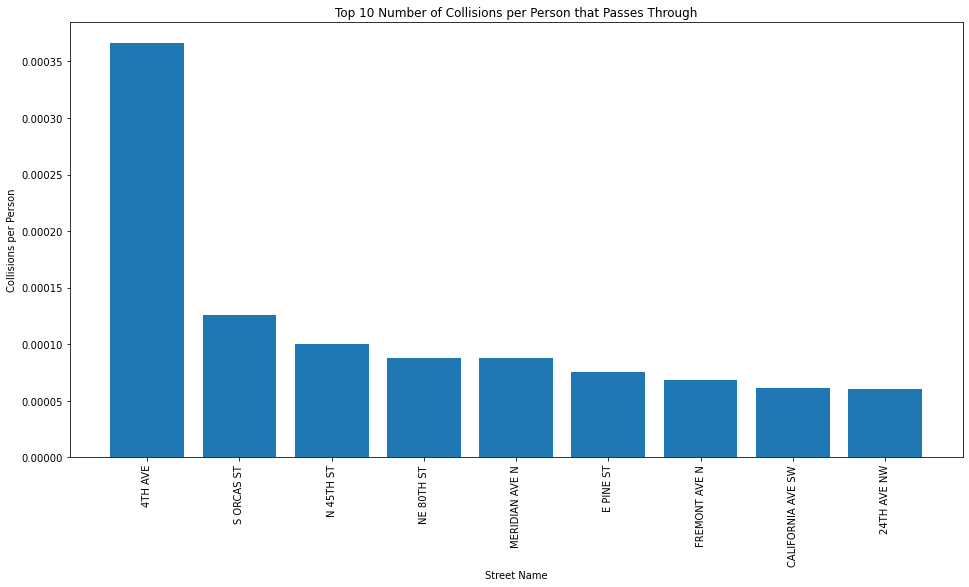

In [155]:
# Sort by AVG_COUNT descending
df_traffic.sort_values('AVG_COUNT',ascending=False,inplace=True)

# Plot top 10 AVG_COUNT
y = df_traffic['AVG_COUNT'].head(10)
x = df_traffic['STNAME'].head(10)

plt.figure(figsize=(16,8))
plt.bar(x,y)

plt.xticks(rotation=90)
plt.title('Top 10 Number of Collisions per Person that Passes Through')
plt.xlabel('Street Name')
plt.ylabel('Collisions per Person')

plt.show()

From the graph it can be seen that 4TH AVE has a severe amount of collisions compared to other streets. For each person that passes through there is a 0.035% chance that there will be a collision. 4TH AVE runs through the city center vertically and is clearly a hotspot for vehicle collisions. This could imply that some measures are necessary to improve the traffic flow and safety on the street.

The second one is S ORCAS ST. A quick google search shows that this is a street that runs horizontally through the suburbs on the south of Seattle and is not a highway. The neighborhood it is in, Beacon Hill, is considered a quiet, upper scale area. An explanation for this high amount of accidents could be that it is so close to the Airport and people are often in a hurry going to and from there.

## Temporal Patterns
In this chapter the temporal patterns of collisions will be shown. To do this the columns ```YEAR```, ```DATE```, ```WEEKDAY```, ```WEEKDAYN```, ```WEEKNR```, ```DAYSTARTHR```, ```MONTH``` and ```HOUR``` will be added to the collisions dataset.

In [156]:
# Add columns Year, Date, Weekday, Week, Hour and DayStartHr to our df
df_t['YEAR'] = pd.DatetimeIndex(df_t['INCDATE']).year

df_t['DATE'] = pd.to_datetime(df_t['INCDATE'])

df_t['WEEKDAY'] = df_t['DATE'].dt.day_name()

df_t['WEEKDAYN'] = df_t['DATE'].dt.weekday

df_t['WEEKNR'] = pd.to_datetime(df_t['INCDATE']).dt.isocalendar().week

df_t['MONTH'] = df_t['DATE'].dt.month_name()

df_t = df_t.assign(HOUR=lambda row: pd.to_datetime(row['INCDTTM']).dt.strftime("%H"))

In [157]:
# Start hour for each weekday
day2hrs = { 
    'Monday': 0, 
    'Tuesday': 24, 
    'Wednesday': 48,
    'Thursday': 72,
    'Friday': 96,
    'Saturday': 120,
    'Sunday': 144,
}

def day2daystarthr (row):
   return day2hrs[row['WEEKDAY']]

df_t['DAYSTARTHR'] = df_t.apply(lambda row: day2daystarthr(row), axis=1)

In [158]:
# Set of weekdays
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

First up is the distribution over the years.

<AxesSubplot:title={'center':'Accidents per Year'}, xlabel='Year', ylabel='Count'>

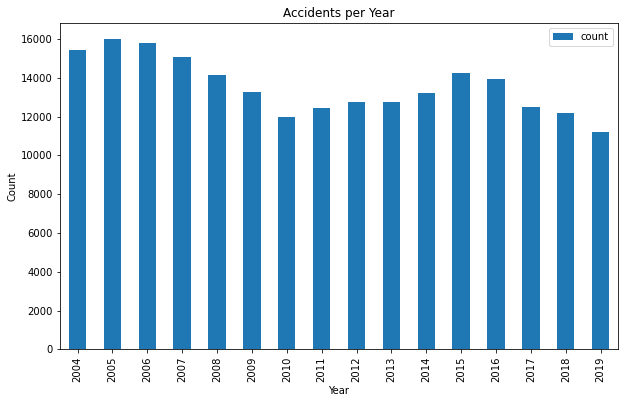

In [159]:
# Range of years in dataset
years = range(2004, 2020)

columns = ['count']
counts = []

# Count number of accident logs for each year
for y in years:
    counts.append(np.sum(pd.DatetimeIndex(df_t['DATE']).year == y))
    
# Plot distribution by years
df_year = pd.DataFrame(counts, index=years, columns=columns)
df_year.plot(kind="bar", figsize=(10,6), title="Accidents per Year", xlabel='Year', ylabel='Count')

This graph shows a significant decline in accidents throughout the years. There is a little spike around 2015 but then it starts declining again and has gone from over 15.000 per year down to less than 12.000. The spike could be explained by the fact that smartphones had increased in popularity around then and more and more people are scrolling through their phone while driving. While talking on the phone while driving is still dangerous scrolling on the phone with no eyes on the road is even worse.

Next up is months of the year.

<AxesSubplot:title={'center':'Accidents per Month'}, xlabel='Month', ylabel='Count'>

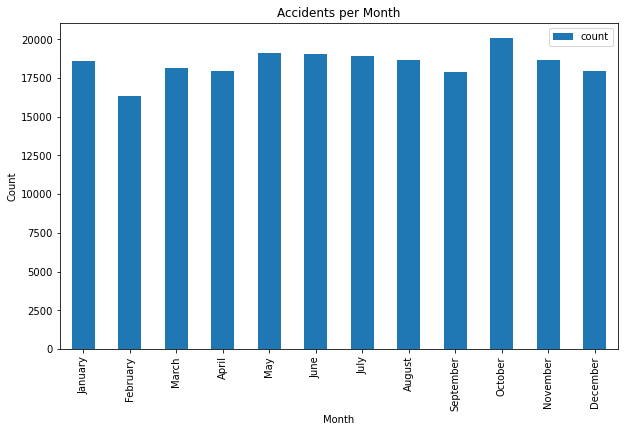

In [160]:
# Set of months
months = ['January', 'February', 'March', 'April', 'May', 'June', 
        'July', 'August', 'September', 'October', 'November', 'December']

columns = ['count']
counts = []

# Count number of accidents for each month
for m in months:
    counts.append(np.sum(df_t['MONTH'] == m))
    
# Plot distribution
df_month = pd.DataFrame(counts, index=months, columns=columns)
df_month.plot(kind="bar", figsize=(10,6), title="Accidents per Month", xlabel='Month', ylabel='Count')

There isn't a lot of difference between months. There is an increase in October and decrease in February though. This could be because in October the weather is getting colder and people are getting used to driving on slippery roads again. February is one of the coldest months in Seattle so people might be more careful when driving in icy/slushy road conditions and therefore less accidents happen.

How are accidents distributed by weekdays?

<AxesSubplot:title={'center':'Accidents per Weekday'}, xlabel='Weekday', ylabel='Count'>

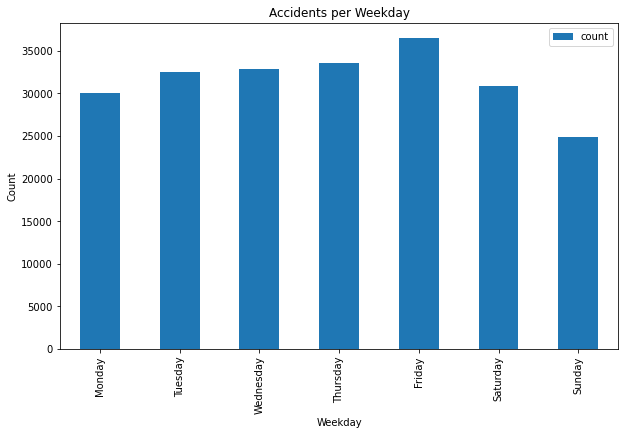

In [161]:
columns = ['count']
counts = []

# Count number of accidents per day of the week
for d in days:
    counts.append(np.sum(df_t['WEEKDAY'] == d))
    
# Plot distribution
df_day = pd.DataFrame(counts, index=days, columns=columns)
df_day.plot(kind="bar", figsize=(10,6), title="Accidents per Weekday", xlabel='Weekday', ylabel='Count')  
    

The number of accidents is quite stable from Monday through Thursday. On Friday there is a big spike that is caused by the increased traffic of people driving home from work, out of the city to vacation houses, shopping for the weekend etc. The accident count then decreases on Saturday and even more on Sunday. This is just in line with the traffic weekday trend - there is less traffic on the weekends than on weekdays.

How about the hours of the day?

In the dataset the timestamp "00:00" is very common (most likely recorded when the time of the accident is not available) so the hour "00" will be dismissed.

<AxesSubplot:title={'center':'Accidents per Hour'}, xlabel='Hours', ylabel='Count'>

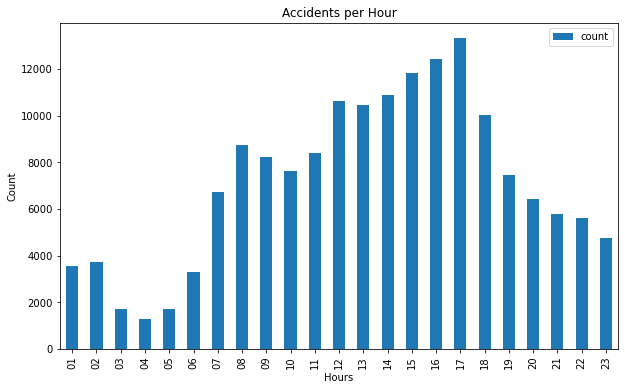

In [162]:
# Set of hours on format "01", "02",.
hours = []
for i in range(1,24):
    hours.append("{:02d}".format(i))

columns = ['count']
counts = []
    
# Count number of accidents per hour of the day
for h in hours:
    counts.append(np.sum((df_t['HOUR'] == h)))
    
# Plot distribution
df_hours = pd.DataFrame(counts, index=hours, columns=columns)
df_hours.plot(kind="bar", figsize=(10,6), title="Accidents per Hour", xlabel='Hours', ylabel='Count') 

The accidents increase from around 4 in the morning until 17 where it reaches a peak and then decreases again. This peak at 17 is mos likely because that is when most people are driving back from work/school, going to the supermarket, driving their kids around etc. There is also a little peak around 8/9 in the morning which is when people are driving to work/school.

Next up is how the accidents distribute over hours of the week.

<AxesSubplot:title={'center':'Hours of the Week'}, xlabel='Hours', ylabel='Count'>

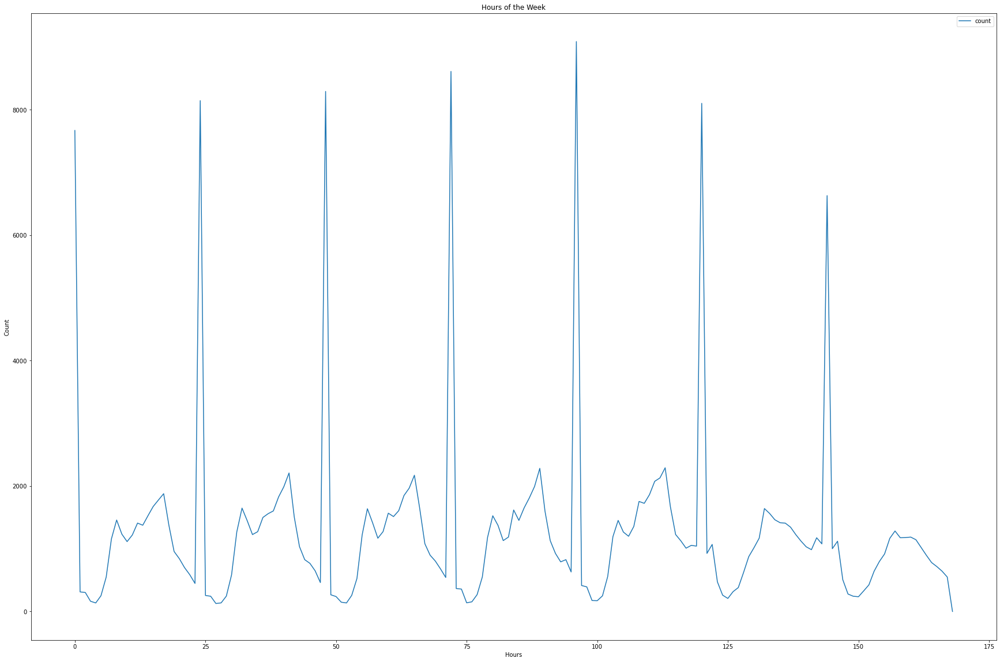

In [163]:
# Set of hours
hours_week = range(0,169)

columns = ['count']
counts = []

# Count accumulated number of accidents per hour of the week
for hour in hours_week:
    counts.append(len(df_t[df_t['HOUR'].astype(int)+df_t['DAYSTARTHR'] == hour]))

df_cat = pd.DataFrame(counts, index=hours_week, columns=columns)
df_cat.plot(kind="line", figsize=(30,20), title='Hours of the Week', xlabel='Hours', ylabel='Count')
    

Even though the hour "00" skews the graph a little it can be seen that Monday through Thursday there is a very similar pattern where there is a small peak in the morning and then a clear peak in the afternoon. On friday the count beigins to increase a little earlier in the day which can be explained by the fact that a lot of people get off school/work earlier on Fridays. On weekends there is not a clear peak as on the other weekdays - the traffic is more distributed throughout the day.

The last thing that will be looked at is the distribution over the weeks of the year.

<AxesSubplot:title={'center':'Accidents per Week of the Year'}, xlabel='Week', ylabel='Count'>

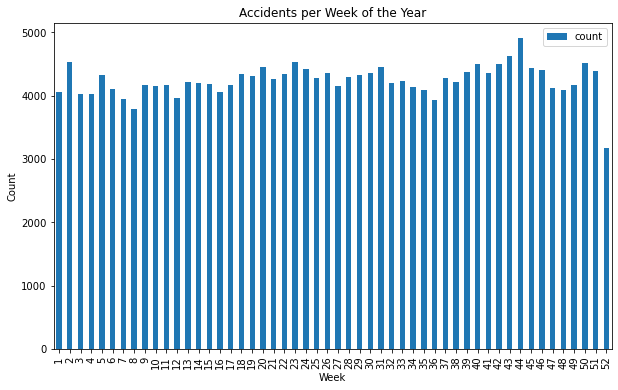

In [164]:
# Set of weeks
weeks = range(1,53)

columns = ['count']
counts = []
    
# Count accumulated number of accidents per week of the year
for w in range(1,53):
    counts.append(np.sum((df_t['WEEKNR'] == w)))
    
# Plot the distrubtion
df_hours = pd.DataFrame(counts, index=weeks, columns=columns)
df_hours.plot(kind="bar", figsize=(10,6), title="Accidents per Week of the Year", xlabel='Week', ylabel='Count') 


There is a huge decrease in accidents around week 52. This is around christmas/new years so people are probably not going to work and school all of the days and are staying at home with their families which results in less traffic.

## Road Condition Analysis
In this section the effect of road condition on accidents will be analysed. First off is to use the weather data to find out approximately how many days of the year the roads are ```Wet```, ```Ice``` and ```Dry```. To do this the following formulas are used:


```math
road_cond['Wet'] = 365*(COUNT[wet and temperature >= 32]/TOTAL)
road_cond['Ice'] = 365*(COUNT[wet and temperature < 32]/TOTAL)
road_cond['Dry'] = rest of the days
```

To find out whether a day is considered to be rainy the percipitation in inches is multiplied by 25.4 to get mm and if the percipitation in mm is more than 0.5 it is considered a rainy day [2]. To distinguish between a wet and icy day it is checked whether the temperature is over/under 35 degrees farenheit [1].

In [165]:
road_cond = {}

# Calculate number of days in a year where roads are wet and icy
road_cond['Wet'] = int(365*(len(df_rain.loc[(df_rain['PRCP']*25.4 > 0.5) & (df_rain['TMIN'] >= 32)])/len(df_rain)))
road_cond['Ice'] = int(365*(len(df_rain.loc[(df_rain['PRCP']*25.4 > 0.5) & (df_rain['TMIN'] < 32)])/len(df_rain)))

# Approximate that if not wet or icy then dry
road_cond['Dry'] = 365 - road_cond['Wet'] - road_cond['Ice']

print("Average Road Condition Day Count per Year:")
print("------------------------------------------")
print(road_cond)

Average Road Condition Day Count per Year:
------------------------------------------
{'Wet': 136, 'Ice': 4, 'Dry': 225}


There are 4 icy days, 136 wet and 225 dry days on average per year in Seattle. Seattle is a quite rainy city but it doesn't get very cold there so this looks rational. 

Let's use this data to see how many accidents happen on average each day by road condition and plot them using a barplot to get a good visual comparison on how "dangerous" each road condition is.

Text(0, 0.5, 'Count')

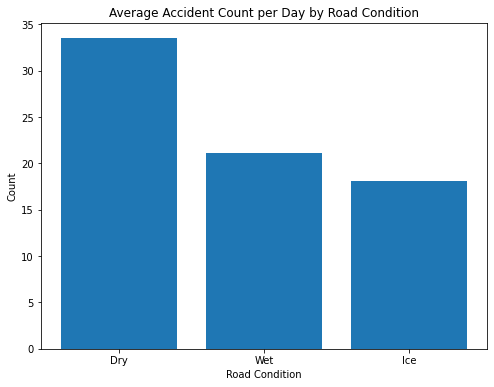

In [166]:
road_cond_count = {}
no_years = 17

# Calculate average number of accidents per day by road condition
road_cond_count['Dry'] = (df_t['ROADCOND'].value_counts()['Dry']/17)/road_cond['Dry']
road_cond_count['Wet'] = (df_t['ROADCOND'].value_counts()['Wet']/17)/road_cond['Wet']
road_cond_count['Ice'] = (df_t['ROADCOND'].value_counts()['Ice']/17)/road_cond['Ice']

# Plot average number of accidents per day per road condition
plt.figure(figsize=(8,6))
plt.bar(range(len(road_cond_count)), list(road_cond_count.values()), align='center')

plt.xticks(range(len(road_cond_count)), list(road_cond_count.keys()))
plt.title('Average Accident Count per Day by Road Condition')
plt.xlabel('Road Condition')
plt.ylabel('Count')

Contrary to what one might probably think - it seems that accidents are more likely to happen on dry roads than wet or icy. It could be that people are more "careless" when driving on dry roads which results in more accidents.

## Linear Regression
In this section linear regression will be used to try to see some patterns in our collision data columns.
### Participant Types and Week Numbers
Do the different participant types participate in accidents around the same time of the week?

In [167]:
# Participant types in collision data
participant_types = ['MOTOR VEH', 'PEDESTRIAN', 'OBJECT']

# Create dictionary with the participant types as keys
counts_tot = dict.fromkeys(participant_types, 0)

for participant_type in participant_types:
    counts = []

    # Count accumulated number of accidents per week that include the participant type
    for week in range(1,53):
        number_week = len(df_t[(df_t['SDOT_COLDESC'].str.find(participant_type) >= 0) & (df_t['WEEKNR'].astype(int) == week)])
        counts.append(number_week)

    # Add list of counts over each week to our count dictionary
    counts_tot[participant_type] = counts

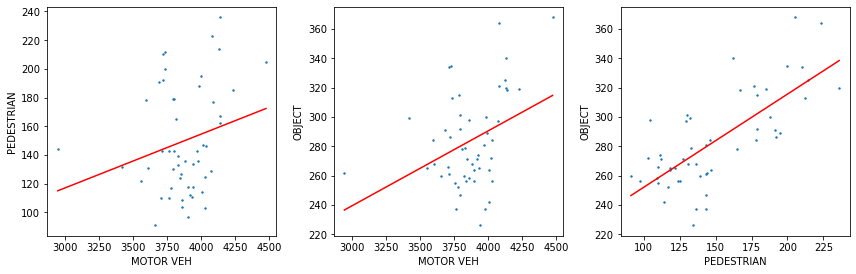

In [168]:
# Keep track of which col the plot should go
col = 0

# Set up 1x3 figure
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

# Iter through all possible tuple combinations in the participant_types set
for combo in combinations(participant_types, 2):

    # Draw line
    x = sum(counts_tot[combo[0]])/len(counts_tot[combo[0]])

    y = sum(counts_tot[combo[1]])/len(counts_tot[combo[1]])

    a = (sum(z * w for z, w in zip(counts_tot[combo[0]], counts_tot[combo[1]]))-len(counts_tot[combo[0]])*x*y)/(sum([o*o for o in counts_tot[combo[0]]])-len(counts_tot[combo[0]])*x*x)

    b = y - a*x
    
    xx = np.linspace(min(counts_tot[combo[0]]), max(counts_tot[combo[0]]))
    
    # Line plot
    axes[col].plot(xx,a*xx+b, 'r-')
    # Scatter plot
    axes[col].scatter(counts_tot[combo[0]], counts_tot[combo[1]], s=2)
    
    axes[col].set_aspect(1./axes[col].get_data_ratio())
        
    # Set labels
    xlabel = combo[0]
    ylabel = combo[1]

    axes[col].set_xlabel(xlabel)
    axes[col].set_ylabel(ylabel)

    # Adjust col/row
    col += 1
            
# Display plot
fig.tight_layout()
plt.show()

It seems as though there isn't a big pattern between when different participants land in an accident. There is *some* correlation between when Pedestrians and still objects land in one but it isn't much.

### Participant Types and Hours of the Day
How about different times of the day?

In [169]:
# Create dictionary with the participant types as keys
counts_tot_hrs = dict.fromkeys(participant_types, 0)

for participant_type in participant_types:
    counts = []

    # Count accumulated number of accidents per hour of the day that include the participant type
    # *DON'T* include hour 0 -> too many and skews the regression model
    for h in range(1,24):
        number_hour = len(df_t[(df_t['SDOT_COLDESC'].str.find(participant_type) >= 0) & (df_t['HOUR'].astype(int) == h)])
        counts.append(number_hour)

    # Add list of counts over each hour to our count dictionary
    counts_tot_hrs[participant_type] = counts

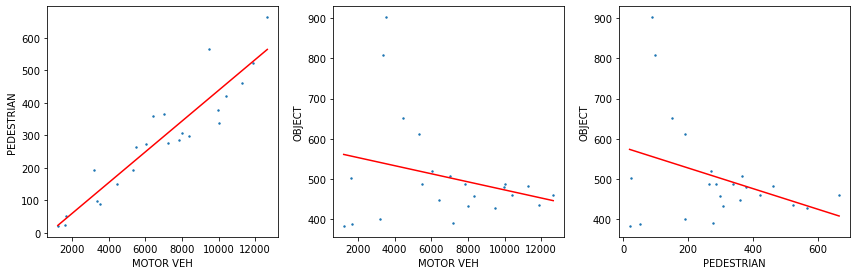

In [170]:
# Keep track of which col the plot should go
col = 0

# Set up 1x3 figure
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))


# Iter through all possible tuple combinations in the participant types set
for combo in combinations(participant_types, 2):

    # Draw line
    x = sum(counts_tot_hrs[combo[0]])/len(counts_tot_hrs[combo[0]])

    y = sum(counts_tot_hrs[combo[1]])/len(counts_tot_hrs[combo[1]])

    a = (sum(z * w for z, w in zip(counts_tot_hrs[combo[0]], counts_tot_hrs[combo[1]]))-len(counts_tot_hrs[combo[0]])*x*y)/(sum([o*o for o in counts_tot_hrs[combo[0]]])-len(counts_tot_hrs[combo[0]])*x*x)

    b = y - a*x
    
    xx = np.linspace(min(counts_tot_hrs[combo[0]]), max(counts_tot_hrs[combo[0]]))
    
    # Line plot
    axes[col].plot(xx,a*xx+b, 'r-')
    # Scatter plot
    axes[col].scatter(counts_tot_hrs[combo[0]], counts_tot_hrs[combo[1]], s=2)
    
    axes[col].set_aspect(1./axes[col].get_data_ratio())
        
    # Set labels
    xlabel = combo[0]
    ylabel = combo[1]

    axes[col].set_xlabel(xlabel)
    axes[col].set_ylabel(ylabel)

    # Adjust col/row
    col += 1
            
# Display plot
fig.tight_layout()
plt.show()

Here a definite correlation can be seen between Pedestrians and Motor Vehicles so it seems that pedestrians and motor vehicle accidents follow a simlar pattern when looking at hours of the day while still objects follow a more random hourly pattern.

### Collision Types and Hours of the Day
Some collision types could be more likely to happen during the night (accidents where a motor vehicle clashes into a still object; parked car,..) while others are possibly more likely to happen during the day (accidents where another person is on the other side; cycles, pedestrians,..). Let's look at if there is any correlation between when different collisions happen during the day.

In [171]:
collision_types = df_t.COLLISIONTYPE.dropna().unique()

# Create dictionary with the different collision types as keys
counts_tot_coll = dict.fromkeys(collision_types, 0)
counts_tot_coll

{'Pedestrian': 0,
 'Angles': 0,
 'Sideswipe': 0,
 'Left Turn': 0,
 'Other': 0,
 'Rear Ended': 0,
 'Parked Car': 0,
 'Right Turn': 0,
 'Cycles': 0,
 'Head On': 0}

In [172]:
for collision_type in collision_types:
    counts = []

    # Count accumulated number of accidents per hour of the day that include the collision type
    # *DON'T* include hour 0 -> too many and skews the regression model
    for h in range(1,24):
        number_hour = len(df_t[(df_t['COLLISIONTYPE'] == collision_type) & (df_t['HOUR'].astype(int) == h)])
        counts.append(number_hour)

    # Add list of counts over each hour to our count dictionary
    counts_tot_coll[collision_type] = counts

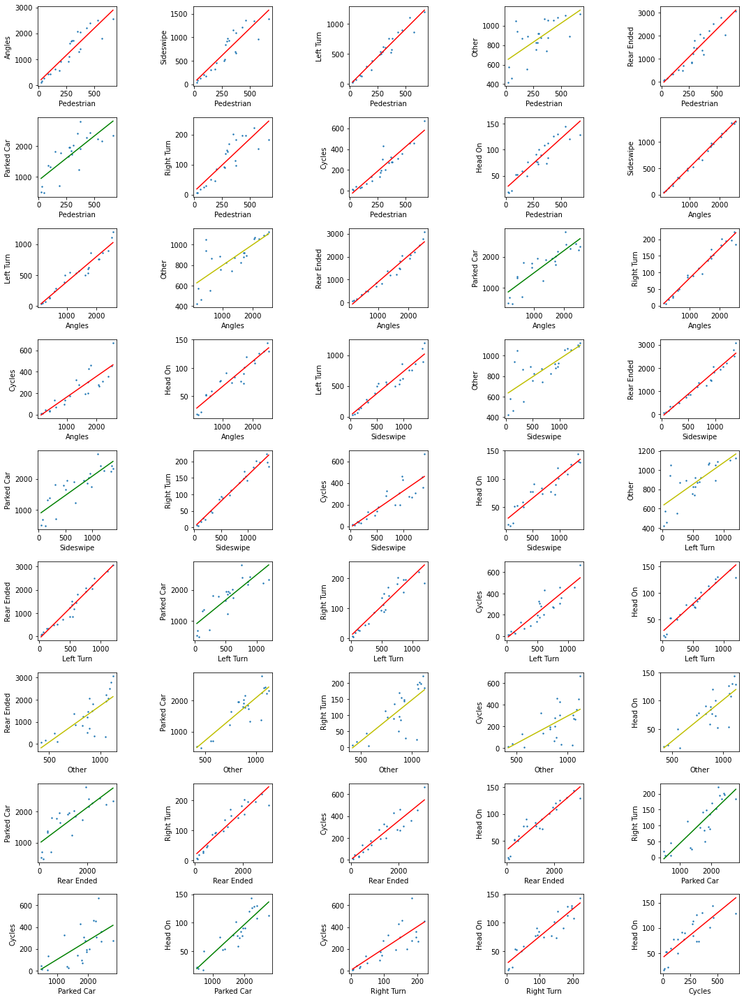

In [173]:
# Keep track of which row+col the plot should go
col = 0
row = 0

# 45 combinations -> Set up 5x9 figure
fig, axes = plt.subplots(nrows=9, ncols=5, figsize=(16, 20))


# Iter through all possible tuple combinations in the collision type set
for combo in combinations(collision_types, 2):

    # Draw line
    x = sum(counts_tot_coll[combo[0]])/len(counts_tot_coll[combo[0]])

    y = sum(counts_tot_coll[combo[1]])/len(counts_tot_coll[combo[1]])

    a = (sum(z * w for z, w in zip(counts_tot_coll[combo[0]], counts_tot_coll[combo[1]]))-len(counts_tot_coll[combo[0]])*x*y)/(sum([o*o for o in counts_tot_coll[combo[0]]])-len(counts_tot_coll[combo[0]])*x*x)

    b = y - a*x
    
    xx = np.linspace(min(counts_tot_coll[combo[0]]), max(counts_tot_coll[combo[0]]))
    
    # Line plot
    line_style = 'r-'
    if(combo[0] == 'Parked Car' or combo[1] == 'Parked Car'):
        line_style = 'g-'
    if(combo[0] == 'Other' or combo[1] == 'Other'):
        line_style = 'y-'
        
    axes[row,col].plot(xx,a*xx+b, line_style)
    # Scatter plot
    axes[row,col].scatter(counts_tot_coll[combo[0]], counts_tot_coll[combo[1]], s=2)
    
    axes[row,col].set_aspect(1./axes[row,col].get_data_ratio())
        
    # Set labels
    xlabel = combo[0]
    ylabel = combo[1]

    axes[row,col].set_xlabel(xlabel)
    axes[row,col].set_ylabel(ylabel)

    # Adjust col/row
    if(col == 4):
        row +=1
        col = 0
    else:
        col += 1
            
# Display plot
fig.tight_layout()
plt.show()

It can be seen that *most* of the collision types follow a quite similar pattern (red lines). 

An interesting observation can be made on the patterns of when collisions involving parked cars happen (green lines). It seems as though they follow a different pattern than the other collision types. Our initial intuition is maybe right and they are more likely to happen during the night while other types happen during the day. The same is to be said for accidents of type 'Other' (yellow lines).

## Factors That Can Affect Severity of Accidents
In this section 10.000 random collision logs will be selected for each severity level and the normalized distribution of the different severity levels for each factor value displayed. This will show what kinds of situations are more common in severe accidents.

In [174]:
# Display Bokeh graphs inside the notebook instead of in a new tab
output_notebook()

Loading BokehJS ...

First off all unique severity values found in the dataset will be extracted and then the 10.000 samples for each one grabbed from the data and stored in a new dataframe "df_sevs". There are very few logs for severities 2b and 3 (<10.000) so in order to keep the amount of logs for each severity type consistent the logs within these types will be oversampled and the other ones undersampled.

In [175]:
# Get severity levels used in our collision data
# Skip SEVERITYCODE '0' because it contains very few logs and skews the plots
severity_levels = list(filter(lambda number: number != '0', df_t.SEVERITYCODE.dropna().unique()))
severity_levels.sort()
print("Severity Level Types: ", severity_levels)

Severity Level Types:  ['1', '2', '2b', '3']


In [176]:
# sample size
n = 10000

# choose n random rows for each severity level 
fn = lambda obj: obj.loc[np.random.choice(obj.index, n),:]
df_sevs = df_t.groupby('SEVERITYCODE', as_index=False).apply(fn)

Now to the normalized count. In this section the factors:
* Collision Type
* Hour of the Day
* Road Condition
* Light Condition
* DUI value

Will be looked at. For each factor a plot showing the normalized distribution of these factors over the different severity levels will be displayed.

In [177]:
# Group logs by each factor and normalize such that sum(df_sevs[SEVERITYCODE]) for each factor = 1
df_t_norm1 = df_sevs[df_sevs['COLLISIONTYPE'].notna()].groupby(['COLLISIONTYPE']).SEVERITYCODE.value_counts(normalize=True).unstack('SEVERITYCODE')
df_t_norm2 = df_sevs[df_sevs['HOUR'].notna()].groupby(['HOUR']).SEVERITYCODE.value_counts(normalize=True).unstack('SEVERITYCODE')
df_t_norm3 = df_sevs[df_sevs['ROADCOND'].notna()].groupby(['ROADCOND']).SEVERITYCODE.value_counts(normalize=True).unstack('SEVERITYCODE')
df_t_norm4 = df_sevs[df_sevs['LIGHTCOND'].notna()].groupby(['LIGHTCOND']).SEVERITYCODE.value_counts(normalize=True).unstack('SEVERITYCODE')
df_t_norm5 = df_sevs[df_sevs['UNDERINFL'].notna()].groupby(['UNDERINFL']).SEVERITYCODE.value_counts(normalize=True).unstack('SEVERITYCODE')

To display the different factors *Bokeh* vbar plots will be used. To differentiate between the different severity levels in the plot a color map is needed.

In [178]:
# Generate 10 colors but only use 4 to avoid getting too light colors
cmap = plt.cm.get_cmap('cubehelix', 10)

Onto the creation of the five plots. The same technique is used to generate each plot. 

In [179]:
sev_col = ColumnDataSource(data=df_t_norm1)

# Initialize plot
pa = figure(x_range=FactorRange(factors=collision_types), plot_width=800, plot_height=600, 
            title='Normalized Severity Level Count per Collision Type')
# To store vbars
bar = {}
items = []

# Populate bars for each severity level
for indx,i in enumerate(severity_levels):
    bar[i] = pa.vbar(x='COLLISIONTYPE',  
                    top=i, # What defines the height of the columns?
                    source=sev_col, # Data
                    width=0.9, # Widht of bars
                    alpha=0.6, # Transparency of shown sev levels
                    muted_alpha=0.05, # Transparency of hidden sev levels
                    muted = True, # Are all sev levels hidden at start?
                    fill_color=mlp.colors.to_hex(cmap(indx)), # Color of bars
                    line_color=None # Outline color of bars
                   )
    items.append((i, [bar[i]]))

# Add axis labels
pa.xaxis.axis_label = "Collision Type"
pa.yaxis.axis_label = "% of Total Logs for Given Collision Type"
    
# Move legend labels to the side of the graph
legend = Legend(items=items, location=(10,0))
pa.add_layout(legend, 'right')

# What happens when we click the legends?
pa.legend.click_policy="mute" 
taba = Panel(child=pa, title="Collision Type")

In [180]:
# Set of hours on format "00", "01",..
hours_bokeh = []
for i in range(1,24):
    hours_bokeh.append("{:02d}".format(i))

hour_col = ColumnDataSource(data=df_t_norm2)

# Initialize plot
pb = figure(x_range=FactorRange(factors=hours_bokeh), plot_width=800, plot_height=600,
           title='Normalized Severity Level Count per Hour of the Day')
bar ={}
items = [] 

for indx,i in enumerate(severity_levels):
    bar[i] = pb.vbar(x='HOUR',
                    top=i, # What defines the height of the columns?
                    source=hour_col, # Data
                    width=0.9, # Widht of bars
                    alpha=0.6, # Transparency of shown sev levels
                    muted_alpha=0.05, # Transparency of hidden sev levels
                    muted = True, # Are all sev levels hidden at start?
                    fill_color=mlp.colors.to_hex(cmap(indx)), # Color of bars
                    line_color=None # Outline color of bars
                   )
    items.append((i, [bar[i]]))

# Add axis labels
pb.xaxis.axis_label = "Hour"
pb.yaxis.axis_label = "% of Total Logs for Given Hour"
    
# Move legend labels to the side of the graph
legend = Legend(items=items, location=(10,0))
pb.add_layout(legend, 'right')

# What happens when we click the legends?
pb.legend.click_policy="mute" 
tabb = Panel(child=pb, title="Hour of the Day")

In [181]:
# Set of road conditions
road_conds = df_t.ROADCOND.dropna().unique()

cond_col = ColumnDataSource(data=df_t_norm3)

# Initialize plot
pc = figure(x_range=FactorRange(factors=road_conds), plot_width=800, plot_height=600,
           title='Normalized Severity Level Count per Road Condition')
bar ={}
items = [] 

for indx,i in enumerate(severity_levels):
    bar[i] = pc.vbar(x='ROADCOND',
                    top=i, # What defines the height of the columns?
                    source=cond_col, # Data
                    width=0.9, # Widht of bars
                    alpha=0.6, # Transparency of shown sev levels
                    muted_alpha=0.05, # Transparency of hidden sev levels
                    muted = True, # Are all sev levels hidden at start?
                    fill_color=mlp.colors.to_hex(cmap(indx)), # Color of bars
                    line_color=None # Outline color of bars
                   )
    items.append((i, [bar[i]]))

# Add axis labels
pc.xaxis.axis_label = "Road Condition"
pc.yaxis.axis_label = "% of Total Logs for Given Road Condition"
    
# Move legend labels to the side of the graph
legend = Legend(items=items, location=(10,0))
pc.add_layout(legend, 'right')

# What happens when we click the legends?
pc.legend.click_policy="mute" 
tabc = Panel(child=pc, title="Road Condition")

In [182]:
# Set of light conditions
light_conds = df_t.LIGHTCOND.dropna().unique()

light_col = ColumnDataSource(data=df_t_norm4)

# Initialize plot
pdd = figure(x_range=FactorRange(factors=light_conds), plot_width=800, plot_height=600,
            title='Normalized Severity Level Count per Light Condition')
bar ={}
items = [] 

for indx,i in enumerate(severity_levels):
    bar[i] = pdd.vbar(x='LIGHTCOND',
                    top=i, # What defines the height of the columns?
                    source=light_col, # Data
                    width=0.9, # Widht of bars
                    alpha=0.6, # Transparency of shown sev levels
                    muted_alpha=0.05, # Transparency of hidden sev levels
                    muted = True, # Are all sev levels hidden at start?
                    fill_color=mlp.colors.to_hex(cmap(indx)), # Color of bars
                    line_color=None # Outline color of bars
                   )
    items.append((i, [bar[i]]))

# Add axis labels
pdd.xaxis.axis_label = "Light Condition"
pdd.yaxis.axis_label = "% of Total Logs for Given Light Condition"
pdd.xaxis.major_label_orientation = "vertical"
    
# Move legend labels to the side of the graph
legend = Legend(items=items, location=(10,0))
pdd.add_layout(legend, 'right')

# What happens when we click the legends?
pdd.legend.click_policy="mute" 
tabd = Panel(child=pdd, title="Light Condition")

In [183]:
# Set of UNDERINFL values
infl_values = df_t.UNDERINFL.dropna().unique()

infl_col = ColumnDataSource(data=df_t_norm5)

# Initialize plot
pe = figure(x_range=FactorRange(factors=infl_values), plot_width=800, plot_height=600,
           title='Normalized Severity Level Count per DUI value')
bar ={}
items = [] 

for indx,i in enumerate(severity_levels):
    bar[i] = pe.vbar(x='UNDERINFL',
                    top=i, # What defines the height of the columns?
                    source=infl_col, # Data
                    width=0.9, # Widht of bars
                    alpha=0.6, # Transparency of shown sev levels
                    muted_alpha=0.05, # Transparency of hidden sev levels
                    muted = True, # Are all sev levels hidden at start?
                    fill_color=mlp.colors.to_hex(cmap(indx)), # Color of bars
                    line_color=None # Outline color of bars
                   )
    items.append((i, [bar[i]]))

# Add axis labels
pe.xaxis.axis_label = "DUI value"
pe.yaxis.axis_label = "% of Total Logs for Given DUI value"
    
# Move legend labels to the side of the graph
legend = Legend(items=items, location=(10,0))
pe.add_layout(legend, 'right')

# What happens when we click the legends?
pe.legend.click_policy="mute" 
tabe = Panel(child=pe, title="DUI value")

Each factor's data is displayed in it's own tab and the user himself can switch between the plots. In this way the user controls the journey he wants to take through the data and can analyse it on his own using the interactive features.

In [184]:
show(Tabs(tabs=[taba, tabb, tabc, tabd, tabe]))

The factors that seem to be repeatedly present in severe accidents are:
* Pedestrian and Head On collisions
* Time of the accident is in the evening/night
* Driver is DUI

These observations will help when deciding on features to include in the decision tree later on in the notebook.

## DUI Patterns
It is interesting to see how much DUI seems to impact the severity of an accident. Here DUI accidents will be analysed further.

Let's start by extracting all logs that were DUI from the dataframe.

In [185]:
df_dui = df_t[df_t['UNDERINFL'] == 'Y']

### DUI and Hours of the Day
Are DUI accidents more likely to happen at certain parts of the day?

<AxesSubplot:title={'center':'DUI Accidents per Hour'}, xlabel='Hours', ylabel='Count'>

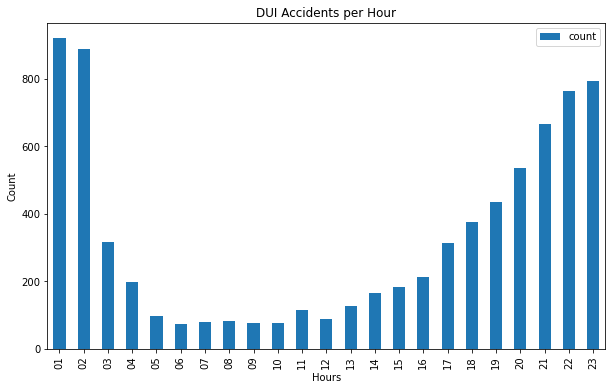

In [186]:
columns = ['count']
counts = []
    
# Count accumulated number of accidents per hour of the day
for h in hours:
    counts.append(np.sum((df_dui['HOUR'] == h)))
    
df_hours_dui = pd.DataFrame(counts, index=hours, columns=columns)
df_hours_dui.plot(kind="bar", figsize=(10,6), title="DUI Accidents per Hour", 
                    xlabel='Hours', ylabel='Count') 

There is a clear trend where DUI accidents increase during later parts of the day and peak shortly after midnight. People tend to drink more during the evening/night so this supports that.

Now let's look at how many are injured in DUI accidents compared to in non-DUI accidents.

In [187]:
# Extract non-DUI accidents
df_nondui = df_t[df_t['UNDERINFL'] == 'N']

In [188]:
# Set of injury counts
injuries = []
for i in range(0,8):
    injuries.append(i)

columns = ['Non-DUI']
counts = []
    
# Count accumulated number of accidents per injury count
for i in injuries:
    counts.append(np.sum((df_nondui['INJURIES'] == i)))
    
df_injuries = pd.DataFrame(counts, index=injuries, columns=columns) 

In [189]:
columns = ['DUI']
counts = []
    
# Count accumulated number of DUI accidents per injury count
for i in injuries:
    counts.append(np.sum((df_dui['INJURIES'] == i)))
    
df_injuries_dui = pd.DataFrame(counts, index=injuries, columns=columns)

array([<AxesSubplot:title={'center':'Non-DUI'}, xlabel='No. Injuries', ylabel='Count'>],
      dtype=object)

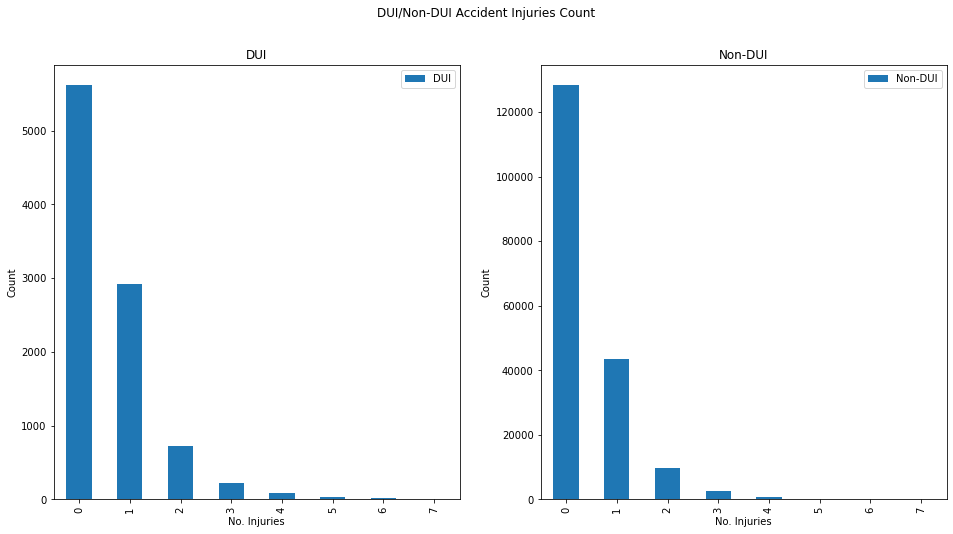

In [190]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8))
df_injuries_dui.plot(ax = axes[0], kind='bar', 
                    xlabel='No. Injuries', ylabel='Count', subplots=True) 
df_injuries.plot(ax = axes[1], kind='bar', title="DUI/Non-DUI Accident Injuries Count", 
                    xlabel='No. Injuries', ylabel='Count', subplots=True)

Injuries are clearly more likely to happen in DUI accidents based on these plots. There are almost as many non-injury accidents as there are injury accidents for DUI logs. This is not the case for non-DUI collisions.

# Folium Maps
To visualize where the collisions are taking place folium maps will be used. 2000 random logs for severities 2, 2b and 3 will be extracted from the dataframe and a point with corresponding severity color will be drawn on the map for each collision. We only care about severities 2, 2b and 3 since severities 0 and 1 do not result in injuries.

In [191]:
# sample size
n = 2000

# choose n random rows for each severity level 
fn = lambda obj: obj.loc[np.random.choice(obj.index, n, replace=True),:]
df_map = df_t.groupby('SEVERITYCODE', as_index=False).apply(fn)

# Remove 0 and 1 sev logs and make sure all logs have coordinates available
df_map = df_map.query(
    "X == X and Y == Y and SEVERITYCODE == SEVERITYCODE and SEVERITYCODE != '0' and SEVERITYCODE != '1'")

In [192]:
feature_groups = {}

# Severity codes 2, 2b and 3 and corresponding colors
sev_codes = ['2', '2b', '3']
colors = {
    '3': '#ff0000',
    '2b': '#ff7100',
    '2': '#ffa600',
}

# Create feature group for each severity code
for code in sev_codes:
    feature_group = FeatureGroup(name=code)
    feature_groups[code] = feature_group

# Map start location, theme and zoom
map_seattle = Map(location=[47.6062, -122.3321], # lat, lon
                    tiles = "Stamen Toner", # map style
                    zoom_start = 10) # zoom

# Add one point for each log, colored according to severity
for index, row in df_map.iterrows():
    folium.CircleMarker( 
        [row.Y, row.X], 
        color=colors[row.SEVERITYCODE],  
        radius=0.5).add_to(feature_groups[row.SEVERITYCODE])

# Add feature groups to map
for group in feature_groups:
    feature_groups[group].add_to(map_seattle)
LayerControl().add_to(map_seattle)

map_seattle

From this map it can be seen that a lot of the most severe accidents (of level 3) are happening on the big roads (highways). The two long roads on the right side of the map seem to be a common area for injury collisions. Let's look at how well the hospitals are located compared to these injury hotspots.

In [193]:
folium.Marker(
    [47.60378576837519, -122.32397652513998], popup="<i>Harborview ER</i>"
).add_to(map_seattle)

folium.Marker(
    [47.71441977845213, -122.33700574278171], popup="<i>UW Medical North West ER</i>"
).add_to(map_seattle)

folium.Marker(
    [47.64966230317373, -122.30857205017486], popup="<i>UW Medical Montlake ER</i>"
).add_to(map_seattle)

folium.Marker(
    [47.44194875493546, -122.21441690970084], popup="<i>Valley Medical ER</i>"
).add_to(map_seattle)

folium.Marker(
    [47.44194875493546, -122.21441690970084], popup="<i>Valley Medical ER</i>"
).add_to(map_seattle)

map_seattle

The ERs seem to be quite well distributed around the city so no injury hotspot is very far away from the next ER. The hotspot on the main road in the lower right part of the city is kind of between two ERs though so if a sever accident occurs there it could take a little time to get to the nearest ER.

## Heatmaps and Temporal Patterns
In this section heatmaps will be used to show accident counts for different time periods to get an even better idea on when most accidents are happening.

First off is Months x Weekdays.

In [310]:
# Log count for each [MONTH,WEEKDAY] combination
df_h = df_t.groupby(['MONTH', 'WEEKDAYN'], sort=False).agg(['count'])
df_h.columns = df_h.columns.droplevel(0)
df_h.reset_index(inplace=True)

In [311]:
# Pandas pivot with multiple variables
heatmap_data = pd.pivot_table(df_h, values='count', index=['MONTH'], columns='WEEKDAYN')
heatmap_data = heatmap_data.loc[months]

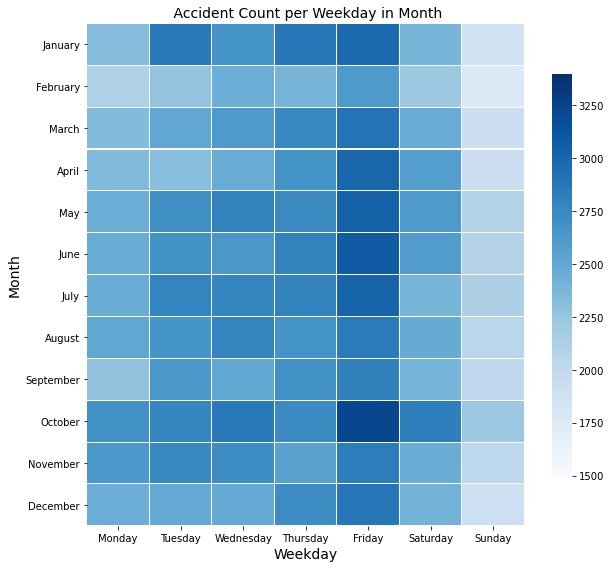

In [313]:
# Plot data using seaborn heatmap
fig, ax = plt.subplots(figsize=(9, 8))
ax.tick_params(axis='x')
ax.tick_params(axis='y')

sns.heatmap(heatmap_data, cmap="Blues", vmin= 1500, vmax=3400,
           linewidth=0.1, cbar_kws={"shrink": .8}, xticklabels=days)

# Style plot
ax.set_xlim(0, 7)
plt.xticks(rotation=0)
plt.xlabel("Weekday", size=14)
plt.ylabel("Month", size=14)
plt.title(" Accident Count per Weekday in Month", size=14)
plt.tight_layout()

From this graph it can be seen that Sundays and February are the most "calm" months.

Now let's look at Weekday x Hour.

In [314]:
# Log count for each [WEEKDAY,HOUR] combination
df_w = df_t.groupby(['WEEKDAY', 'HOUR'], sort=False).agg(['count'])
df_w.columns = df_w.columns.droplevel(0)
df_w.reset_index(inplace=True)
df_w = df_w.drop(df_w[df_w.HOUR == '00'].index)

In [315]:
# Pandas pivot with multiple variables
heatmap_data2 = pd.pivot_table(df_w, values='count', index=['WEEKDAY'], columns='HOUR')
heatmap_data2 = heatmap_data2.loc[days]

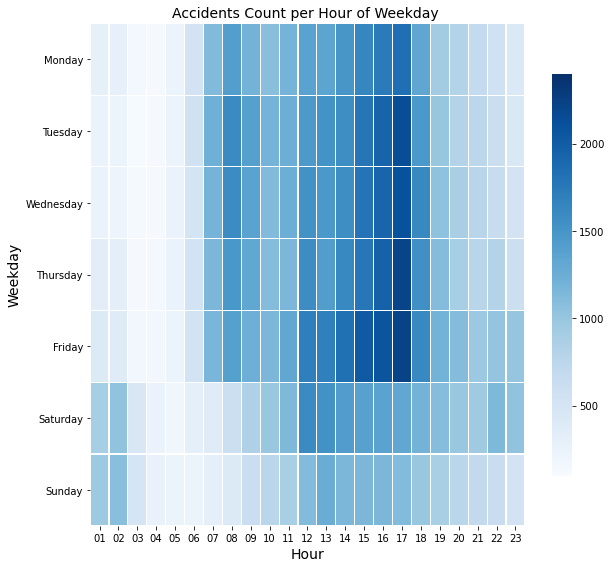

In [316]:
# Plot data using seaborn heatmap
fig2, ax = plt.subplots(figsize=(9, 8))

sns.heatmap(heatmap_data2, cmap="Blues", vmin= 100, vmax=2400,
           linewidth=0.1, cbar_kws={"shrink": .8}, xticklabels=hours)

# Style plot
ax.set_xlim(0, 23)
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.xlabel("Hour", size=14)
plt.ylabel("Weekday", size=14)
plt.title("Accidents Count per Hour of Weekday ", size=14)
plt.tight_layout()

There is a hotspot around the afternoon during the weekdays which, as said in the temporal pattern section, can be explained by a lot of traffic on the streets on those hours. It can also be seen that around midnight almost no accidents happen on weekdays but quite a few on weekends (the "box" in the lower left corner). This could be a result of DUI after partying on weekends.

Next is WeekNr x Weekday.

In [317]:
# Log count for each [WEEKNR,WEEKDAYN] combination
df_wn = df_t.groupby(['WEEKNR', 'WEEKDAYN'], sort=False).agg(['count'])
df_wn.columns = df_wn.columns.droplevel(0)
df_wn.reset_index(inplace=True)

In [318]:
# Pandas pivot with multiple variables
heatmap_data = pd.pivot_table(df_wn, values='count', index=['WEEKNR'], columns='WEEKDAYN')

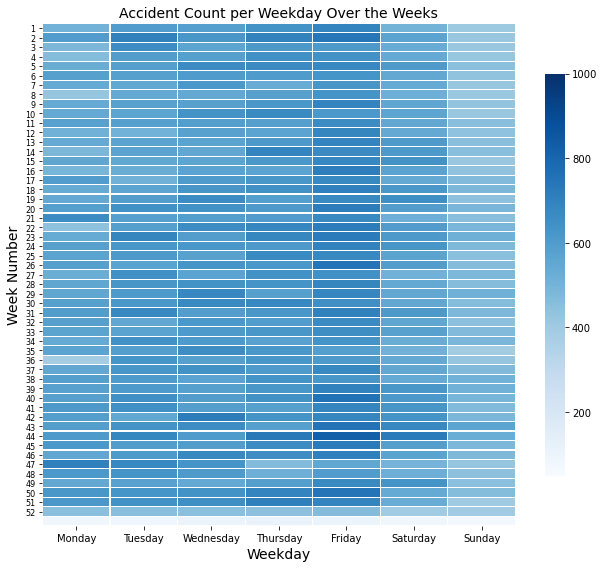

In [320]:
yticks = [a for a in range(1, 53)]

# Plot data using seaborn heatmap
fig3, ax = plt.subplots(figsize=(9, 8))
sns.heatmap(heatmap_data, cmap="Blues", vmin= 50, vmax=1000,
           linewidth=0.1, cbar_kws={"shrink": .8}, 
           xticklabels=days, yticklabels=weeks)

# Style plot
ax.set_xlim(0, 7)
ax.tick_params(axis='y', labelsize=8)
plt.xticks(rotation=0)
plt.xlabel("Weekday", size=14)
plt.ylabel("Week Number", size=14)
plt.title("Accident Count per Weekday Over the Weeks", size=14)
plt.tight_layout()

The heatmap shows clear patterns between the weekdays but there isn't very much difference between the weeks of the year.

## Desicion Tree
In this section a decision tree will be set up that will, given some collision features, make an educated guess on whether an injury will result in an ER case (injury to people involved).

To start with a new column ```ER``` will be added to the dataset. The value will be "Y" for accidents of severity 2, 2b or 3 and "N" for accidents of severity 1. Accidents of severity 0 are not of interest since they don't result in any injuries to people.

In [267]:
# Create ER column with Y / N
df_t.loc[df_t.SEVERITYCODE == "1", "ER"] = "N" # no injury
df_t.loc[df_t.SEVERITYCODE == "2", "ER"] = "Y" # injury
df_t.loc[df_t.SEVERITYCODE == "2b", "ER"] = "Y" # serious injury
df_t.loc[df_t.SEVERITYCODE == "3", "ER"] = "Y" # fatal

Next is sampling an equal amount of logs for each ```ER``` value. Undersampling will be used in order to obtain 

$n = min(count(ER), count(!ER))$ 

logs for each ER value (Y and N).

In [268]:
# sample size
n = min(len(df_t[df_t['ER'] == 'Y']), len(df_t[df_t['ER'] == 'N']))

# choose n random rows for each ER value 
fn = lambda obj: obj.loc[np.random.choice(obj.index, n),:]
df_dt = df_t.groupby('ER', as_index=False).apply(fn)

In [269]:
print('Number of logs: ', len(df_dt))
print('Number of YES logs: ', len(df_dt[df_dt['ER'] == 'Y']))
print('Number of NO logs: ', len(df_dt[df_dt['ER'] == 'N']))

Number of logs:  124290
Number of YES logs:  62145
Number of NO logs:  62145


The objective is to "guess" whether an accident is an ER case given some characteristics. To do this it is best to use characteristics that one would assume could affect whether an accident is severe or not. This has already been analysed in the sections above. The ones used are the following:

* ```UNDERINFL```: Whether the person was DUI or not
* ```MONTH```
* ```WEEKDAY```
* ```HOUR```: Hour of the day
* ```COLLISIONTYPE```: What kind of a collision it is (parked car, pedestrian, head on,..)

This means that ```ER``` is our *target variable* and the four points above are our *features*.

Next the data will be split into features and target variables.

In [270]:
feature_cols = ['UNDERINFL','MONTH', 'WEEKDAY', 'HOUR','COLLISIONTYPE']
features = df_dt[feature_cols] # features; what is used to identify the ER value
y = df_dt.ER # target variable

# create label encoder
le = LabelEncoder()

# change from feature string -> feature integer code
X = features[features.columns[:]].apply(le.fit_transform)
    
# change from ER -> integer code (0 or 1 in our case) 
label = le.fit_transform(y)

The data has been cleaned and prepped.

All feature columns were transformed from their original value to enumarated values (Monday -> 1, Tuesday -> 2 for example) in order to improve computation time. The same was done for our target variable (```ER```).

In order to set up a model the data needs to be split into training and testing data. The training data is used to "teach" the model about the characteristics of ER/NON-ER and the testing data is then used to see how well the model does in identifying whether an accident is an ER case given the feature values. It was decided to go with a 70/30 split where 70% of the data is used for training and 30% saved for testing the model. That way ~35.000 logs are available for training the mode

In [271]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, label, test_size=0.3, random_state=1) # 70% training and 30% test

Now the only thing left to do is actually set up the model, train it and see how accurately it guesses the ER value.

In [272]:
# create Decision Tree classifer object
clf = DecisionTreeClassifier()

# train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

# predict the response for test dataset
y_pred = clf.predict(X_test)

# model accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6992517499396572


An accuracy of ~70%. Not bad. Let's, however, try to *tweak the classifier parameters* to get better accuracy. 

To prevent overfitting to the training data limiting the maximum depth at which the decision tree looks could be a good idea. Searching too deep down the tree can result in getting results that are too heavily influenced by how the training data is set up and not on more general characteristics. Let's find which maximum search depth gives the highest test data accuracy.

In [273]:
test_accuracies = dict()
train_accuracies = dict()

for i in range(1,15):
    # create classifier
    clf = DecisionTreeClassifier(max_depth=i)
    # train
    clf = clf.fit(X_train,y_train)
    # predict for testing data
    y_pred = clf.predict(X_test)
    # predict for training data
    y_pred_train = clf.predict(X_train)

    # calculate accuracy for testing + training data
    test_accuracies[i] = metrics.accuracy_score(y_test, y_pred)
    train_accuracies[i] = metrics.accuracy_score(y_train, y_pred_train)

# find depth with highest accuracy    
print("BEST MODEL")
print("----------")
print("Max depth: ", max(test_accuracies, key=test_accuracies.get))

BEST MODEL
----------
Max depth:  4


It seems that a maximum depth of 4 gives the most accuracy. Let's create a decision tree with this max depth, set the minimum samples for each leaf as 10 in order to avoid a bunch of tiny leaf nodes. Lastly a 7-fold cross validation to make sure the model is not overfitting will be performed.

In [274]:
# create DTC object
clf = DecisionTreeClassifier(max_depth=max(test_accuracies, key=test_accuracies.get), min_samples_leaf=10)
# train
clf = clf.fit(X_train,y_train)
# predict
y_pred = clf.predict(X_test)

# 7-fold cross validation
cvs_mean = cross_val_score(estimator=clf, X=X, y=y, cv=7).mean()

print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))
print("Cross validation score: ", cvs_mean)

Accuracy:  0.7010218038458444
Cross validation score:  0.7009655178057779


The model gives an accuracy of ~70% so it has improved by 1% and the cross validation score is very close to the accuracy which implies that our model is not overfitting.

Another quick way to see if the model is overfitting is comparing the accuracy of the model on the training data and the testing data. If the accuracy is much more on the training data than the testing data the model is obviously overfitted. Let's look at this for the different values of max_depth above:

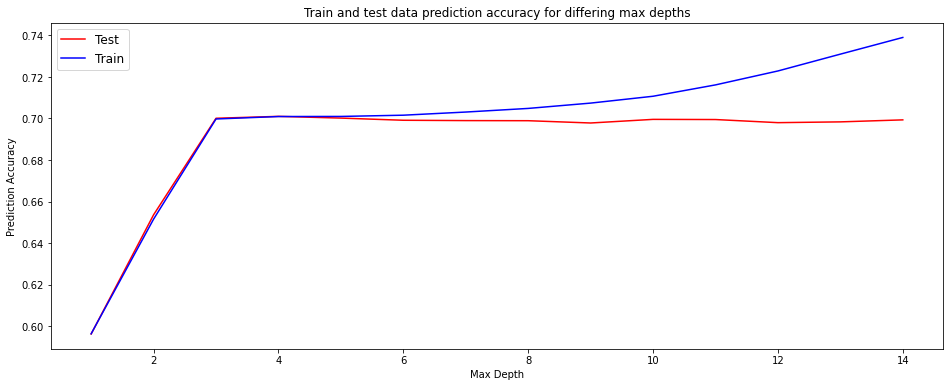

In [275]:
plt.figure(figsize=(16,6))
plt.plot(list(test_accuracies.keys()), list(test_accuracies.values()), 'r', label='Test')
plt.plot(list(train_accuracies.keys()), list(train_accuracies.values()), 'b' ,label='Train')

plt.title('Train and test data prediction accuracy for differing max depths')
plt.xlabel('Max Depth')
plt.ylabel('Prediction Accuracy')
plt.legend(loc="upper left", fontsize='large')
plt.show()

You can see from the graph that as we search deeper in the tree the difference between the accuracy of the model on the training data and the testing data increases -> the model overfits to the training data. The chosen depth of 4 looks to be not overfitting which is good news.

Now let's visualize the decision tree using both the inbuilt method and the *dtreeviz* package.

In [277]:
# Overwrite default graph colors for dtreeviz
GREEN = '#05B400'
RED = '#FF1600'
DARKBLUE = '#313695'
BLUE = '#4575b4'
LIGHTORANGE = '#fee090'

colors2 = [
    None,  # 0 classes
    None,  # 1 class
    [GREEN, RED],  # 2 classes
    ['#FEFEBB', '#D9E6F5', '#a1dab4'],  # 3 classes
    ['#FEFEBB', '#D9E6F5', '#a1dab4', LIGHTORANGE],  # 4
    ['#FEFEBB', '#D9E6F5', '#a1dab4', '#41b6c4', LIGHTORANGE],  # 5
    ['#FEFEBB', '#c7e9b4', '#41b6c4', '#2c7fb8', LIGHTORANGE, '#f46d43'],  # 6
    ['#FEFEBB', '#c7e9b4', '#7fcdbb', '#41b6c4', '#225ea8', '#fdae61', '#f46d43'],  # 7
    ['#FEFEBB', '#edf8b1', '#c7e9b4', '#7fcdbb', '#1d91c0', '#225ea8', '#fdae61', '#f46d43'],  # 8
    ['#FEFEBB', '#c7e9b4', '#41b6c4', '#74add1', BLUE, DARKBLUE, LIGHTORANGE, '#fdae61', '#f46d43'],  # 9
    ['#FEFEBB', '#c7e9b4', '#41b6c4', '#74add1', BLUE, DARKBLUE, LIGHTORANGE, '#fdae61', '#f46d43', '#d73027']  # 10
]

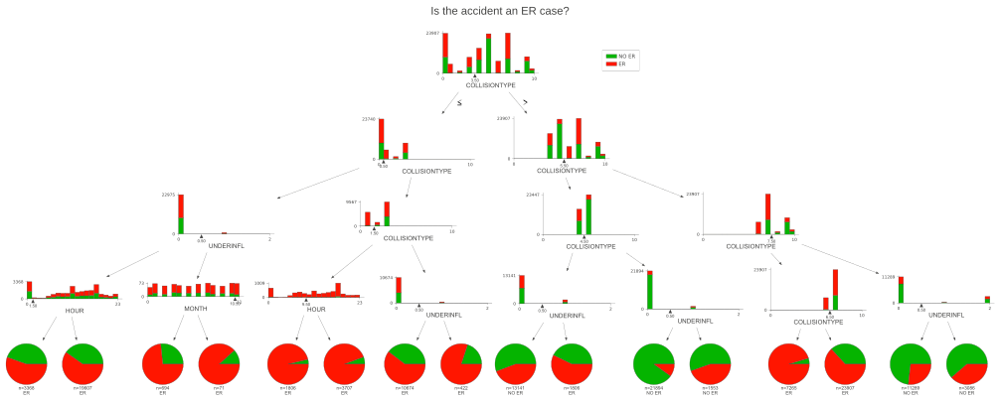

In [141]:
viz = dtreeviz(clf, X, label,
                title="Is the accident an ER case?",
                title_fontsize=16,
                scale=0.7,
                feature_names=feature_cols,
                class_names=(['NO ER','ER']),
                colors={
                  'classes': colors2,
                })

viz.save("tree_dtreeviz.svg")
viz

## Genres
The website's genre is an annotated graph, with various features of the visualization ensuring that the reader does not lose his position in the story during the exploratory stage. The story therefore starts with some static figures about temporal patterns and leads down to an interactive graph with a few annotations. It continues to another interactive visualization and ends with a static figure of a decision tree. The visualizations are different in a way that they don’t all look the same and display different kinds of interesting data analysis. 

---

From the three categories of visual Narrative, the tools that were used are: 

<b>Highlighting:</b> Zooming 

The tool Zooming is used on the interactive map of Seattle which displays the number of injuries. It allows the reader to zoom in to see the location in a more detailed way e.g. street names. 

----

Then the tools used from the three categories of Narrative Structure were: 

<b>Interactivity:</b> Hover Highlighting/Details, Filtering/Selection 

<b>Messaging:</b> Captions/Headlines, Introductory Text and Summary/Synthesis 

The interactive Bokeh graph and the Seattle folium map allow the user to highlight and filter specific severity types, and from that feature it will display the user's selection. 
The website is structured in a way that it contains headlines and before each visualisation there is a introduction to the relevant topic. After each visualisation a summary of the results are presented, and the interesting discoveries are emphasised. 



## Visualizations
For the majority of the visualizations in this notebook bar and plots were chosen. Bar and line plots are useful when comparing counts or other numerical values between different categories because it is intuitive for the eye to identify the difference just by looking at the heights of the bars.

In the linear regression section a graph, each with a scatter plot and a linear regression line through the points, were displayed for each combination of the categories under inspection. Displaying the line *and* the points helps show how much correlation there is between the different category values by checking how well the points follow the line.

When looking at what factors affect the severity of a collision it was decided to go with an interactive bokeh box plot in order to allow the user to explore the categories on his own and not overwhelm him with 5 different graphs in a row with all of the severity types shown on each graph.

In order to visualize where in the city the accidents are mostly happening (their spacial patterns) folium maps were used. To distinguish between accidents of different severities a dropdown allowing the user to select/deselect specific severities was implemented in order to see whether there was a difference in how severe vs non-severe accidents spread around the city. This also allows the user to control his journey through the map based on what he is interested in seeing.

In order to show a lot of information in little space heatmaps are often useful. They can not only show individual patterns for both axises but also allow for a quick analysis on the data by identifying hot spots.

For the decision tree it was hard find the best way to visualize the outcome. In the authors' opinion the dtreeviz was the best option to go. It shows clearly what decision is being made at each node in the tree and why. It also shows the split of ER/NON-ER values at each node and the resulting value at the leef nodes. All of this together helps display what factors affect whether the tree thinks a given accident is an ER case or not.

Since the outcome of this project is not designed for a scientist/engineer to read it was important that the visualizations on the website were intuitive for people with no/little background in statistics. That is why emphasis was laid on labelling the graphs with non-scientific vocabulary and putting the information forward in a simple manner (no box-plots, logarithmic plots, etc).

## Discussion
The purpose of this project was to 
1. identify where, when and under what cirumstances accidents are more likely to occur
2. What factors can affect how severe an accident is

We feel like exploring the first point went really well and the data we had at hand, had good information that could help us identify these patterns in accidents overall. 

For the second point there was diffuculty identifying factors affecting the severness of accidents, specially the missing part of the project was the fact the number of logs (~3.000) for severe accidents (of severity 2b or 3) was a hindering factor in exploring that in detail. With such few logs on high severity collisions it made the analysis on their characteristics less reliable because each and every log has much more impact on the results than if there were more logs. 

We also tried to look into the weather data of Seattle to see whether the weather has an effect on how many accidents occur. The results were that an accident is more likely to occur when the road is dry, rather than wet or icy, which was a little surprising.

## References
[1] - https://atmos.washington.edu/~cliff/Roadway2.htm 

[2] - https://water.usgs.gov/edu/activity-howmuchrain-metric.html

[3] - http://vis.stanford.edu/files/2010-Narrative-InfoVis.pdf

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b60d1261-8d15-4bec-b8f9-e84f0716eaf6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>